# General Tests


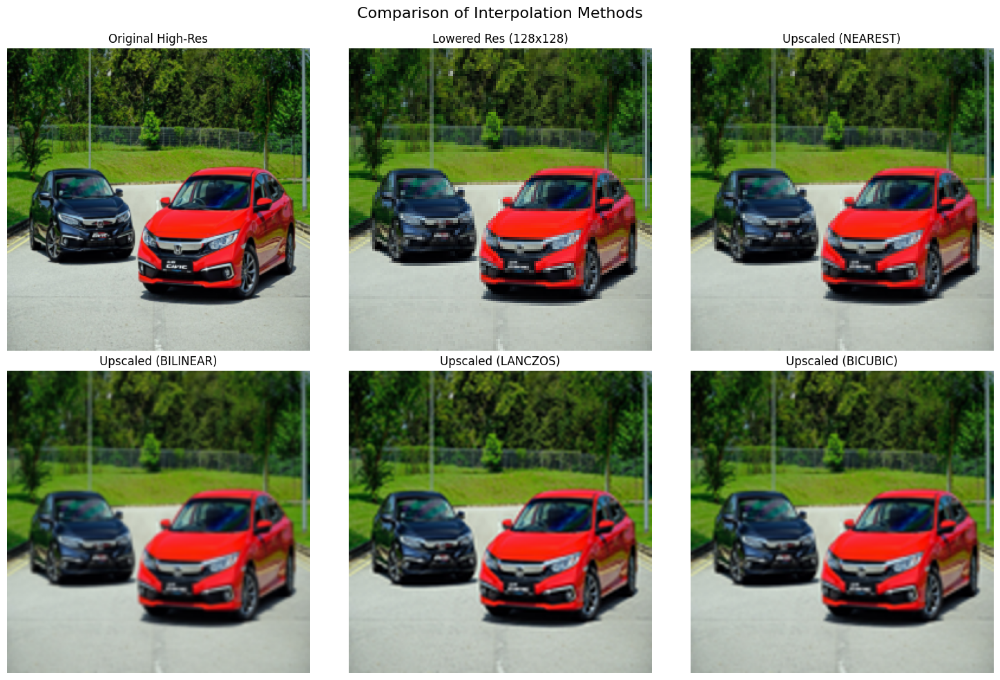

In [1]:
from PIL import Image
import matplotlib.pyplot as plt

# Open the original high-resolution image
image = Image.open("/Users/vsb/Documents-Not cloud/DIP proj/dataset/train/high_res/0.png") # png image

# Lower the resolution to (128, 128)
low_res_lower_size = (128, 128)
low_res_lowered = image.resize(low_res_lower_size)

# Upscale back to (256, 256) using different interpolation methods
new_size = (256, 256)

# Using various interpolation methods
high_res_image_nearest = low_res_lowered.resize(new_size, Image.NEAREST)
high_res_image_bilinear = low_res_lowered.resize(new_size, Image.BILINEAR)
high_res_image_lanczos = low_res_lowered.resize(new_size, Image.LANCZOS)
high_res_image_bicubic = low_res_lowered.resize(new_size, Image.BICUBIC)

# Set up the grid layout
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Comparison of Interpolation Methods', fontsize=16)

# Original high-resolution image
axes[0, 0].imshow(image)
axes[0, 0].set_title('Original High-Res')
axes[0, 0].axis('off')

# Lowered resolution image
axes[0, 1].imshow(low_res_lowered)
axes[0, 1].set_title('Lowered Res (128x128)')
axes[0, 1].axis('off')

# Nearest Neighbor interpolation
axes[0, 2].imshow(high_res_image_nearest)
axes[0, 2].set_title('Upscaled (NEAREST)')
axes[0, 2].axis('off')

# Bilinear interpolation
axes[1, 0].imshow(high_res_image_bilinear)
axes[1, 0].set_title('Upscaled (BILINEAR)')
axes[1, 0].axis('off')

# Lanczos interpolation
axes[1, 1].imshow(high_res_image_lanczos)
axes[1, 1].set_title('Upscaled (LANCZOS)')
axes[1, 1].axis('off')

# Bicubic interpolation
axes[1, 2].imshow(high_res_image_bicubic)
axes[1, 2].set_title('Upscaled (BICUBIC)')
axes[1, 2].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()


# Evaluation Metrics

In [18]:
import torch
import lpips
from torchvision.transforms import ToTensor

# Initialize LPIPS model (default is AlexNet)
lpips_model = lpips.LPIPS(net='alex')

def get_lpips_score(High_res,Reconstructed):

    # Convert images to tensors (normalized to [-1, 1])
    original_tensor = ToTensor()(High_res).unsqueeze(0) * 2 - 1
    sr_tensor = ToTensor()(Reconstructed).unsqueeze(0) * 2 - 1

    # Calculate LPIPS
    lpips_value = lpips_model(original_tensor, sr_tensor)
    return lpips_value


def calculate_psnr(original, sr, max_pixel=255.0):
    mse = np.mean((original - sr) ** 2)
    if mse == 0:  # Perfect match
        return float('inf')
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

#We also use SSIM


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/opt/homebrew/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/homebrew/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /Users/vsb/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|████████████████████████████████████████| 233M/233M [00:05<00:00, 45.6MB/s]


Loading model from: /opt/homebrew/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


# Nearest Neigbour Interpolation

In [137]:
import numpy as np
from skimage.metrics import structural_similarity as ssim
def nearest_neighbor_interpolation_fixed_scale(input_image, scale=2):
    # Get the input image dimensions
    in_height, in_width, channels = input_image.shape
    
    # Compute the dimensions of the output image
    new_height = in_height * scale
    new_width = in_width * scale
    
    # Create an empty array for the output image
    output_image = np.zeros((new_height, new_width, channels), dtype=input_image.dtype)
    
    # Iterate over every pixel in the output image
    for y in range(new_height):
        for x in range(new_width):
            # Find the nearest pixel in the input image
            in_y = y // scale
            in_x = x // scale
            
            # Assign the value from the nearest neighbor
            output_image[y, x] = input_image[in_y, in_x]
    
    return output_image

PSNR: 32.81 dB
SSIM: 0.9201
tensor([[[[0.1091]]]], grad_fn=<AddBackward0>)


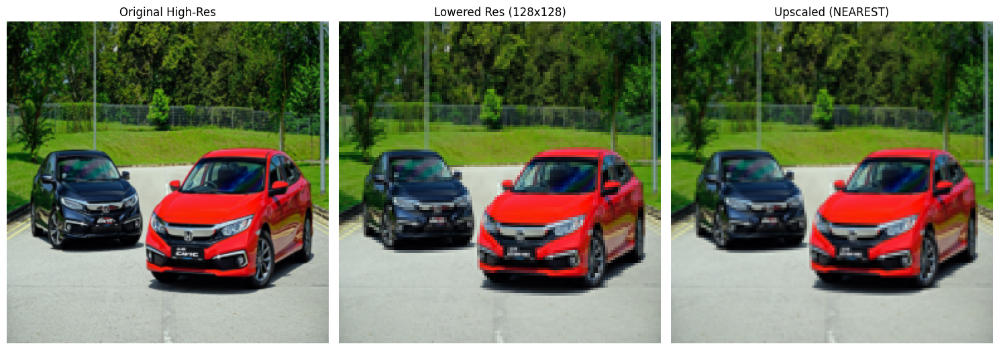

In [138]:
image = Image.open("/Users/vsb/Documents-Not cloud/DIP proj/dataset/train/high_res/0.png") # png image
low_res_image=Image.open("/Users/vsb/Documents-Not cloud/DIP proj/dataset/train/high_res/0.png")
low_res_image = low_res_image.resize((128,128))

image=np.array(image)
low_res_image=np.array(low_res_image)

nn_output = nearest_neighbor_interpolation_fixed_scale(low_res_image)

image = image.reshape((256, 256, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB
nn_output = np.array(nn_output)
nn_output = nn_output.reshape((256, 256, 4))
# high_res_image_nearest = high_res_image_nearest.reshape((256, 256, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB

psnr = calculate_psnr(image, nn_output)
print(f"PSNR: {psnr:.2f} dB")

# SSIM expects grayscale or RGB images in range [0, 255]
ssim_value, _ = ssim(image, nn_output, win_size=3, multichannel=True, full=True)
print(f"SSIM: {ssim_value:.4f}")

lpips_score = get_lpips_score(image[:, :, :3],nn_output[:, :, :3])
print(lpips_score)

fig, axes = plt.subplots(1, 3, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Lowered resolution image
axes[ 1].imshow(low_res_image)
axes[ 1].set_title('Lowered Res (128x128)')
axes[ 1].axis('off')

# Nearest Neighbor interpolation
axes[ 2].imshow(nn_output)
axes[ 2].set_title('Upscaled (NEAREST)')
axes[ 2].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

## Staircase Effect

(512, 512)


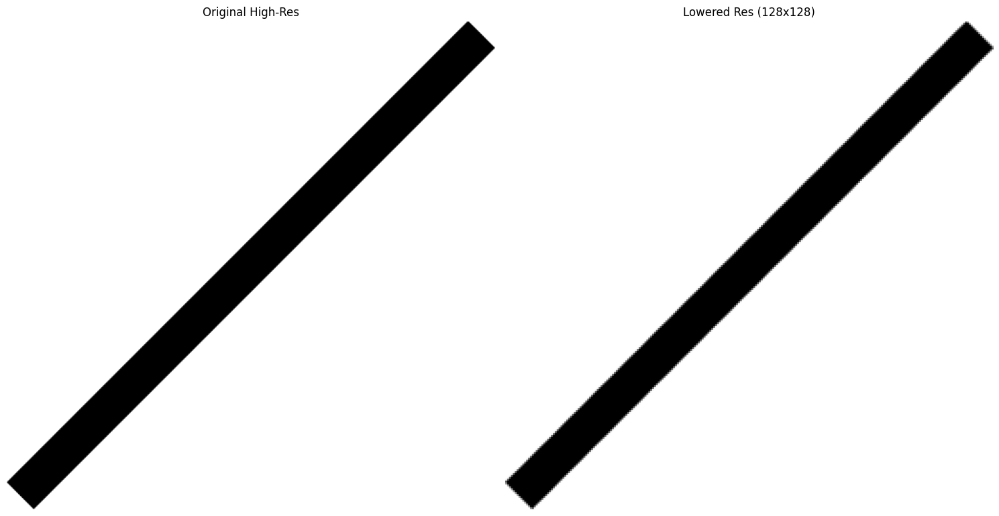

In [69]:
image = Image.open("Staircase-Effect.png") # png image
print(image.size)
low_res_image = image.resize((256,256))

image=np.array(image)
low_res_image=np.array(low_res_image)

nn_output = nearest_neighbor_interpolation_fixed_scale(low_res_image)

image = image.reshape((512, 512, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB
nn_output = np.array(nn_output)
nn_output = nn_output.reshape((512, 512, 4))

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# staircase  image
axes[ 1].imshow(nn_output)
axes[ 1].set_title('Lowered Res (128x128)')
axes[ 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

# Bilinear Interpolation

In [102]:
def bilinear_interpolation_fixed_scale(input_image, scale=2):
    # Get input image dimensions
    in_height, in_width, channels = input_image.shape
    
    # Compute output dimensions
    new_height = in_height * scale
    new_width = in_width * scale
    
    # Create an empty array for the output image
    output_image = np.zeros((new_height, new_width, channels), dtype=input_image.dtype)
    
    for y in range(new_height):
        for x in range(new_width):
            # Find the corresponding position in the input image
            in_y = y / scale
            in_x = x / scale
            
            # Get the coordinates of the four surrounding pixels
            y0 = int(np.floor(in_y))
            x0 = int(np.floor(in_x))
            y1 = min(y0 + 1, in_height - 1)  # Clamp to avoid out-of-bounds
            x1 = min(x0 + 1, in_width - 1)  # Clamp to avoid out-of-bounds
            
            # Compute the distances to the surrounding pixels
            dy = in_y - y0
            dx = in_x - x0
            
            # Interpolate pixel value for each channel
            for c in range(channels):
                # Get pixel values of the four neighbors
                I00 = input_image[y0, x0, c]
                I10 = input_image[y1, x0, c]
                I01 = input_image[y0, x1, c]
                I11 = input_image[y1, x1, c]
                
                # Bilinear interpolation formula
                output_image[y, x, c] = (
                    (1 - dy) * (1 - dx) * I00 +
                    dy * (1 - dx) * I10 +
                    (1 - dy) * dx * I01 +
                    dy * dx * I11
                )
    
    return output_image


PSNR: 32.44 dB
SSIM: 0.9114
tensor([[[[0.1632]]]], grad_fn=<AddBackward0>)


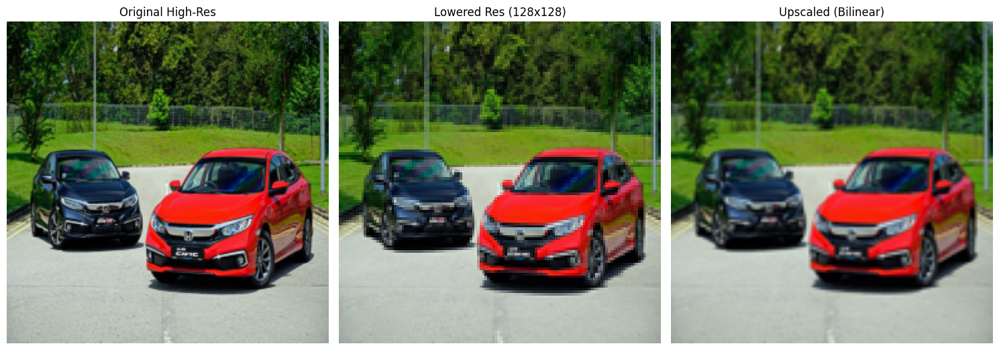

In [103]:
image = Image.open("/Users/vsb/Documents-Not cloud/DIP proj/dataset/train/high_res/0.png") # png image
low_res_image=Image.open("/Users/vsb/Documents-Not cloud/DIP proj/dataset/train/high_res/0.png")
low_res_image = image.resize((128,128))

image=np.array(image)
low_res_image=np.array(low_res_image)

bili_output = bilinear_interpolation_fixed_scale(low_res_image)

image = image.reshape((256, 256, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB
bili_output = np.array(bili_output)
bili_output = bili_output.reshape((256, 256, 4))
# high_res_image_nearest = high_res_image_nearest.reshape((256, 256, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB

psnr = calculate_psnr(image, bili_output)
print(f"PSNR: {psnr:.2f} dB")

# SSIM expects grayscale or RGB images in range [0, 255]
ssim_value, _ = ssim(image, bili_output, win_size=3, multichannel=True, full=True)
print(f"SSIM: {ssim_value:.4f}")

lpips_score = get_lpips_score(image[:, :, :3],bili_output[:, :, :3])
print(lpips_score)

fig, axes = plt.subplots(1, 3, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Lowered resolution image
axes[ 1].imshow(low_res_image)
axes[ 1].set_title('Lowered Res (128x128)')
axes[ 1].axis('off')

# Bilinear interpolation
axes[ 2].imshow(bili_output)
axes[ 2].set_title('Upscaled (Bilinear)')
axes[ 2].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

## Smoothing of images

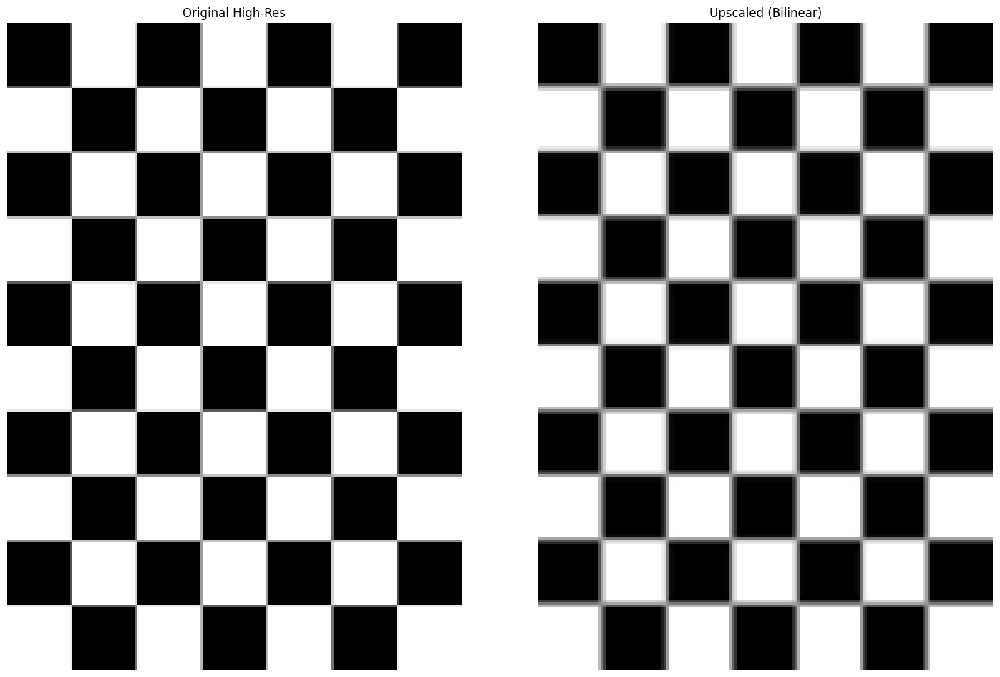

In [104]:
image = Image.open("Bilinear_error.png") # png image
image = image.convert('RGBA')
low_res_image = image.resize((94, 134))

image=np.array(image)
low_res_image=np.array(low_res_image)
bili_output = bilinear_interpolation_fixed_scale(low_res_image)

image = image.reshape((268, 188, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB
bili_output = np.array(bili_output)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Bilinear interpolation
axes[ 1].imshow(bili_output)
axes[ 1].set_title('Upscaled (Bilinear)')
axes[ 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

# Bicubic Interpolation

In [108]:
import numpy as np

def cubic_kernel(x, a=-0.5): # Adjust `a` to control sharpness and ringing.
    abs_x = np.abs(x)
    if abs_x <= 1:
        return (a + 2) * (abs_x ** 3) - (a + 3) * (abs_x ** 2) + 1
    elif 1 < abs_x <= 2:
        return a * (abs_x ** 3) - 5 * a * (abs_x ** 2) + 8 * a * abs_x - 4 * a
    else:
        return 0

def bicubic_interpolation_rgba(image, scale=2, a=-0.5):
    in_height, in_width, channels = image.shape
    out_height, out_width = int(in_height * scale), int(in_width * scale)
    upscaled_image = np.zeros((out_height, out_width, channels), dtype=np.float32)

    for channel in range(channels):
        for i in range(out_height):
            for j in range(out_width):
                # Map the output pixel to input image coordinates
                x = i / scale
                y = j / scale
                x_int = int(x)
                y_int = int(y)
                x_frac = x - x_int
                y_frac = y - y_int

                value = 0
                for m in range(-1, 3):
                    for n in range(-1, 3):
                        px = min(max(x_int + m, 0), in_height - 1)
                        py = min(max(y_int + n, 0), in_width - 1)

                        weight_x = cubic_kernel(x_frac - m, a)
                        weight_y = cubic_kernel(y_frac - n, a)

                        value += image[px, py, channel] * weight_x * weight_y

                upscaled_image[i, j, channel] = value

    return np.clip(upscaled_image, 0, 255).astype(np.uint8)

PSNR: 32.53 dB
SSIM: 0.9154
tensor([[[[0.2133]]]], grad_fn=<AddBackward0>)


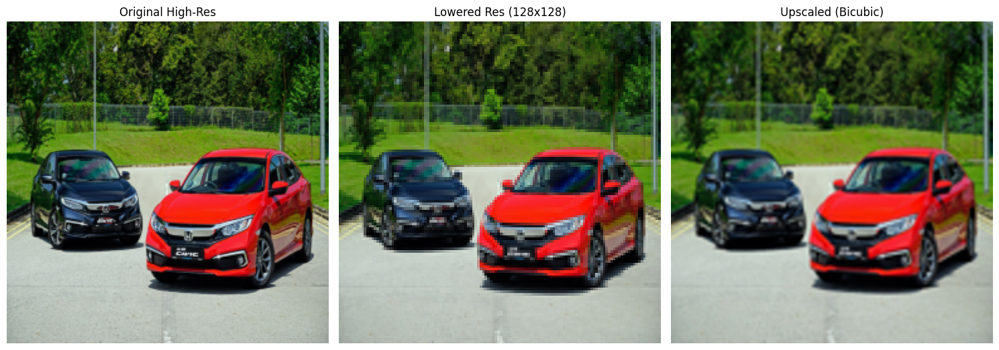

In [114]:
image = Image.open("/Users/vsb/Documents-Not cloud/DIP proj/dataset/train/high_res/0.png") # png image
low_res_image = image.resize((128,128))

image=np.array(image)
low_res_image=np.array(low_res_image)

bicu_output = bicubic_interpolation_rgba(low_res_image,scale=2,a=-0.5)

image = image.reshape((256, 256, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB
bicu_output = np.array(bicu_output)
bicu_output = bicu_output.reshape((256, 256, 4))

psnr = calculate_psnr(image, bicu_output)
print(f"PSNR: {psnr:.2f} dB")

# SSIM expects grayscale or RGB images in range [0, 255]
ssim_value, _ = ssim(image, bicu_output, win_size=3, multichannel=True, full=True)
print(f"SSIM: {ssim_value:.4f}")

lpips_score = get_lpips_score(image[:, :, :3],bicu_output[:, :, :3])
print(lpips_score)

fig, axes = plt.subplots(1, 3, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Lowered resolution image
axes[ 1].imshow(low_res_image)
axes[ 1].set_title('Lowered Res (128x128)')
axes[ 1].axis('off')

# Bilinear interpolation
axes[ 2].imshow(bicu_output)
axes[ 2].set_title('Upscaled (Bicubic)')
axes[ 2].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

## Ringing Artifact

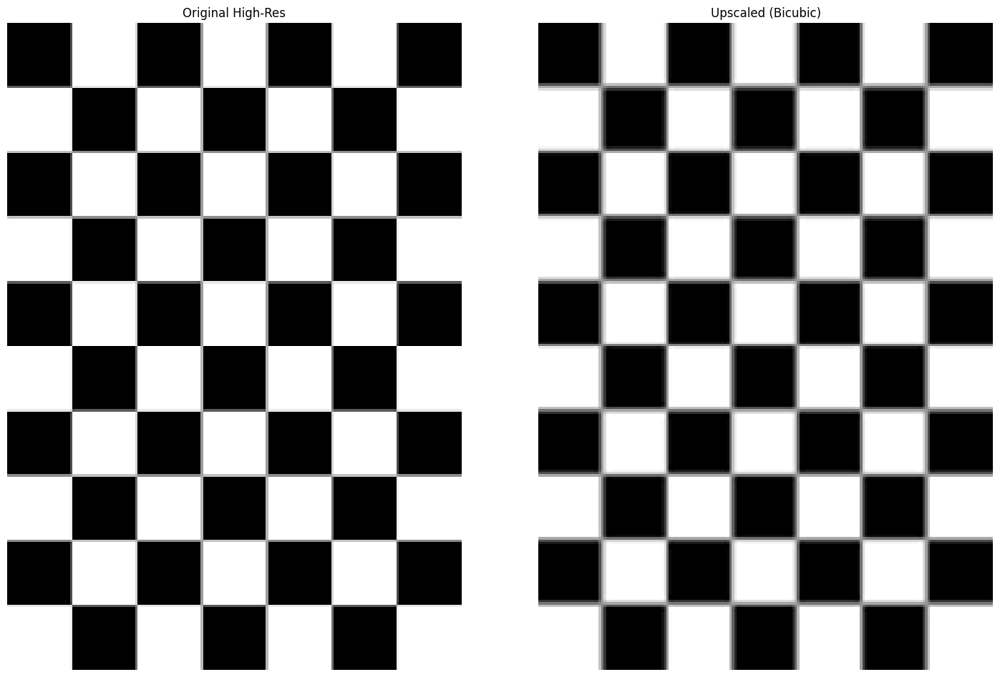

In [196]:
image = Image.open("Bilinear_error.png") # png image
image = image.convert('RGBA')

image.size
low_res_image = image.resize((94, 134))

image=np.array(image)
low_res_image=np.array(low_res_image)
bicu_output = bicubic_interpolation_rgba(low_res_image,scale=2,a=-0.5)

image = image.reshape((268, 188, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB
bicu_output = np.array(bicu_output)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Bilinear interpolation
axes[ 1].imshow(bicu_output)
axes[ 1].set_title('Upscaled (Bicubic)')
axes[ 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

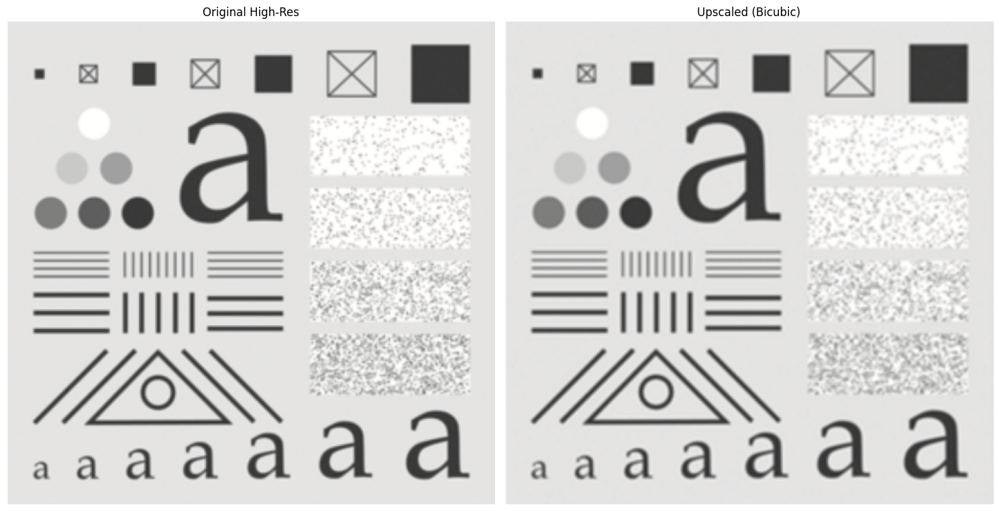

In [197]:
image = Image.open("Ringing.png") # png image
image = image.convert('RGBA')
low_res_image = image.resize((255, 252))

image=np.array(image)
low_res_image=np.array(low_res_image)
bicu_output = bicubic_interpolation_rgba(low_res_image,scale=2,a=-0.5)

image = image.reshape((504, 510, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB
bicu_output = np.array(bicu_output)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Bilinear interpolation
axes[ 1].imshow(bicu_output)
axes[ 1].set_title('Upscaled (Bicubic)')
axes[ 1].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

# Spline Interpolation

In [119]:
def natural_cubic_spline_1d(x, y, x_new):
    """Performs natural cubic spline interpolation for 1D arrays."""
    n = len(x) - 1  # Number of intervals
    h = np.diff(x)
    
    if np.any(h == 0):
        raise ValueError("Repeated x values detected, leading to division by zero.")
    
    # Formulate the system for c coefficients
    A = np.zeros((n + 1, n + 1), dtype=np.float64)
    b = np.zeros(n + 1, dtype=np.float64)
    for i in range(1, n):
        A[i, i - 1] = h[i - 1]
        A[i, i] = 2 * (h[i - 1] + h[i])
        A[i, i + 1] = h[i]
        b[i] = 3 * ((y[i + 1] - y[i]) / h[i] - (y[i] - y[i - 1]) / h[i - 1])
    
    # Natural spline boundary conditions
    A[0, 0] = 1
    A[n, n] = 1
    
    # Solve for c coefficients
    c = solve_tridiagonal(A, b)
    
    # Compute a, b, d coefficients
    a = y[:-1]
    b = np.zeros(n, dtype=np.float64)
    d = np.zeros(n, dtype=np.float64)
    for i in range(n):
        b[i] = (y[i + 1] - y[i]) / h[i] - h[i] * (2 * c[i] + c[i + 1]) / 3
        d[i] = (c[i + 1] - c[i]) / (3 * h[i])
    
    # Interpolate for x_new
    spline_values = []
    for x_val in x_new:
        i = np.searchsorted(x, x_val) - 1
        i = max(0, min(i, n - 1))  # Clamp to valid interval
        dx = x_val - x[i]
        spline_values.append(a[i] + b[i] * dx + c[i] * dx**2 + d[i] * dx**3)
    
    return np.array(spline_values)

def natural_cubic_spline_2d(image, scale=2):
    """Performs 2D cubic spline interpolation for an RGBA image."""
    # Ensure input is in float64 to avoid overflow
    image = image.astype(np.float64)
    
    in_height, in_width, channels = image.shape
    out_height, out_width = in_height * scale, in_width * scale
    
    # Scale grid
    x_old = np.arange(in_width)
    y_old = np.arange(in_height)
    x_new = np.linspace(0, in_width - 1, out_width)
    y_new = np.linspace(0, in_height - 1, out_height)
    
    # Initialize output image
    output_image = np.zeros((out_height, out_width, channels), dtype=np.float64)
    
    for c in range(channels):  # Process each channel independently
        # Step 1: Interpolate rows
        row_interpolated = np.zeros((in_height, out_width))
        for i in range(in_height):
            row_interpolated[i, :] = natural_cubic_spline_1d(x_old, image[i, :, c], x_new)
        
        # Step 2: Interpolate columns
        col_interpolated = np.zeros((out_height, out_width))
        for j in range(out_width):
            col_interpolated[:, j] = natural_cubic_spline_1d(y_old, row_interpolated[:, j], y_new)
        
        # Assign the interpolated channel back
        output_image[:, :, c] = col_interpolated
    
    # Clip values to valid range (0–255) and convert back to uint8
    return np.clip(output_image, 0, 255).astype(np.uint8)


PSNR: 32.81 dB
SSIM: 0.9292
tensor([[[[0.2417]]]], grad_fn=<AddBackward0>)


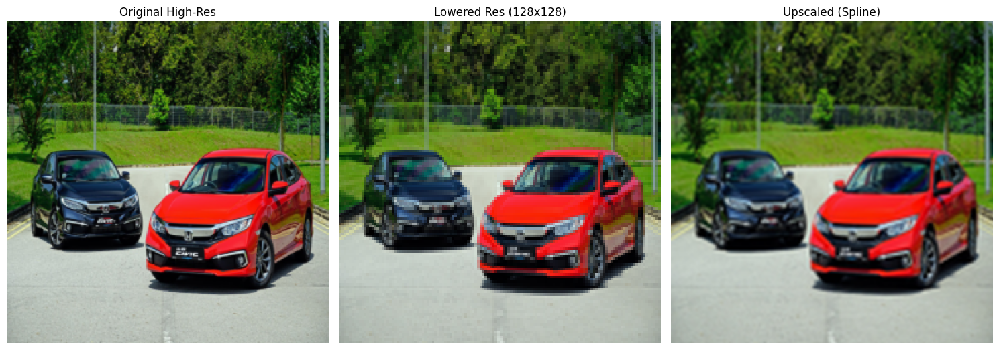

In [120]:
image = Image.open("/Users/vsb/Documents-Not cloud/DIP proj/dataset/train/high_res/0.png") # png image
low_res_image=Image.open("/Users/vsb/Documents-Not cloud/DIP proj/dataset/train/high_res/0.png")
low_res_image = low_res_image.resize((128,128))

image=np.array(image)
low_res_image=np.array(low_res_image)

spline_output = natural_cubic_spline_2d(low_res_image)

image = image.reshape((256, 256, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB
spline_output = np.array(spline_output)
spline_output = spline_output.reshape((256, 256, 4))
# high_res_image_nearest = high_res_image_nearest.reshape((256, 256, 4))  # Replace `4` with `1` or `3` if it's grayscale or RGB

psnr = calculate_psnr(image, spline_output)
print(f"PSNR: {psnr:.2f} dB")

# SSIM expects grayscale or RGB images in range [0, 255]
ssim_value, _ = ssim(image, spline_output, win_size=3, multichannel=True, full=True)
print(f"SSIM: {ssim_value:.4f}")

lpips_score = get_lpips_score(image[:, :, :3],spline_output[:, :, :3])
print(lpips_score)

fig, axes = plt.subplots(1, 3, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Lowered resolution image
axes[ 1].imshow(low_res_image)
axes[ 1].set_title('Lowered Res (128x128)')
axes[ 1].axis('off')

# Nearest Neighbor interpolation
axes[ 2].imshow(spline_output)
axes[ 2].set_title('Upscaled (Spline)')
axes[ 2].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

# EDI

/var/folders/fk/f95cfhjx7vgfw_bbzkymf6540000gn/T/ipykernel_83416/3760428614.py:48: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

In new code, for regular grids use `RegularGridInterpolator` instead.
For scattered data, prefer `LinearNDInterpolator` or
`CloughTocher2DInterpolator`.

For more details see
`https://scipy.github.io/devdocs/notebooks/interp_transition_guide.html`

  interp = interp2d(np.arange(w), np.arange(h), image[:, :, channel], kind='cubic')
/var/folders/fk/f95cfhjx7vgfw_bbzkymf6540000gn/T/ipykernel_83416/3760428614.py:49: DeprecationWarning: `interp2d` is deprecated in SciPy 1.10 and will be removed in SciPy 1.14.0.

For legacy code, nearly bug-for-bug compatible replacements are
`RectBivariateSpline` on regular grids, and `bisplrep`/`bisplev` for
scattered 2D data.

I

PSNR: 24.02 dB
SSIM: 0.8850


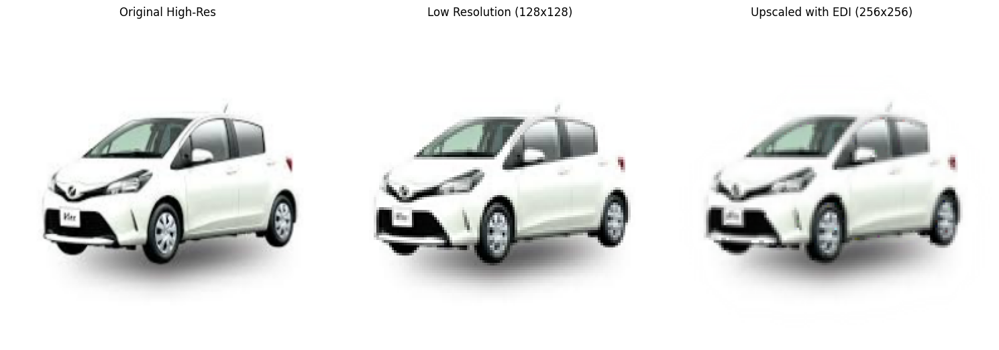

In [132]:
import numpy as np
from PIL import Image
from scipy.ndimage import convolve, gaussian_filter
from scipy.interpolate import interp2d
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

def scharr_kernels():
    """Define Scharr kernels for edge detection."""
    scharr_x = np.array([[3, 0, -3], [10, 0, -10], [3, 0, -3]], dtype=np.float32)
    scharr_y = np.array([[3, 10, 3], [0, 0, 0], [-3, -10, -3]], dtype=np.float32)
    return scharr_x, scharr_y

def compute_gradients(image, sigma=1, threshold=0.1):
    """Compute edge gradients using Scharr kernels and Gaussian smoothing."""
    scharr_x, scharr_y = scharr_kernels()
    channels = image.shape[2]
    grad_x = np.zeros_like(image)
    grad_y = np.zeros_like(image)

    for channel in range(channels):
        gx = convolve(image[:, :, channel], scharr_x)
        gy = convolve(image[:, :, channel], scharr_y)

        gx = gaussian_filter(gx, sigma=sigma)
        gy = gaussian_filter(gy, sigma=sigma)

        magnitude = np.sqrt(gx**2 + gy**2)
        gx /= (magnitude + 1e-6)
        gy /= (magnitude + 1e-6)

        # Threshold weak gradients
        gx[magnitude < threshold] = 0
        gy[magnitude < threshold] = 0

        grad_x[:, :, channel] = gx
        grad_y[:, :, channel] = gy

    return grad_x, grad_y

def bicubic_interpolation(image, scale):
    """Perform bicubic interpolation."""
    h, w, c = image.shape
    upscaled = np.zeros((h * scale, w * scale, c), dtype=np.float32)
    for channel in range(c):
        interp = interp2d(np.arange(w), np.arange(h), image[:, :, channel], kind='cubic')
        upscaled[:, :, channel] = interp(
            np.linspace(0, w - 1, w * scale), np.linspace(0, h - 1, h * scale)
        )
    return upscaled

def interpolate_pixel_color(x, y, grad_x, grad_y, low_res_image, bicubic_image, scale):
    """Perform edge-aware interpolation for a single pixel."""
    low_x, low_y = x // scale, y // scale
    max_x, max_y = low_res_image.shape[0] - 1, low_res_image.shape[1] - 1
    interpolated_pixel = np.zeros(3, dtype=np.float32)

    for channel in range(3):  # Only process RGB channels
        neighbors = low_res_image[
            max(0, low_x):min(max_x + 1, low_x + 2),
            max(0, low_y):min(max_y + 1, low_y + 2),
            channel
        ]

        if neighbors.shape == (2, 2):
            gx, gy = grad_x[low_x, low_y, channel], grad_y[low_x, low_y, channel]
            if np.abs(gx) > np.abs(gy):
                value = (neighbors[0, 0] + neighbors[0, 1]) / 2
            else:
                value = (neighbors[0, 0] + neighbors[1, 0]) / 2
        else:
            value = np.mean(neighbors)

        weight = np.sqrt(grad_x[low_x, low_y, channel]**2 + grad_y[low_x, low_y, channel]**2)
        interpolated_pixel[channel] = weight * value + (1 - weight) * bicubic_image[x, y, channel]

    return interpolated_pixel

def edge_directed_interpolation(low_res_image, scale=2):
    """Perform Edge-Directed Interpolation (EDI)."""
    rgb_image = low_res_image[:, :, :3]  # Extract RGB channels
    alpha_channel = low_res_image[:, :, 3]  # Extract alpha channel

    grad_x, grad_y = compute_gradients(rgb_image)
    bicubic_image = bicubic_interpolation(rgb_image, scale)
    new_height, new_width = rgb_image.shape[0] * scale, rgb_image.shape[1] * scale
    upscaled_rgb = np.zeros((new_height, new_width, 3), dtype=np.float32)

    for y in range(new_height):
        for x in range(new_width):
            upscaled_rgb[y, x] = interpolate_pixel_color(
                y, x, grad_x, grad_y, rgb_image, bicubic_image, scale
            )

    # Process alpha channel with bicubic interpolation only
    alpha_channel = np.expand_dims(alpha_channel, axis=-1)  # Add a channel dimension
    upscaled_alpha = bicubic_interpolation(alpha_channel, scale).squeeze()  # Remove the extra channel dimension

    upscaled_image = np.dstack((upscaled_rgb, upscaled_alpha))
    return np.clip(upscaled_image, 0, 255).astype(np.uint8)

def calculate_psnr(original, reconstructed):
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    return 20 * np.log10(max_pixel / np.sqrt(mse))

# Example usage
image = Image.open("dataset/train/high_res/3.png").convert("RGBA")  # Load RGBA image
low_res_image = image.resize((128, 128))  # Downscale for testing

low_res_array = np.array(low_res_image, dtype=np.float32)

upscaled_image = edge_directed_interpolation(low_res_array, scale=2)

original_image = np.array(image, dtype=np.float32)
rescaled_original = np.array(image.resize(upscaled_image.shape[:2], resample=Image.BICUBIC), dtype=np.float32)

psnr = calculate_psnr(rescaled_original, upscaled_image)
print(f"PSNR: {psnr:.2f} dB")

rescaled_original_rgb = rescaled_original[:, :, :3]
upscaled_image_rgb = upscaled_image[:, :, :3]
ssim_value = ssim(
    rescaled_original_rgb, 
    upscaled_image_rgb, 
    win_size=3,
    multichannel=True, 
    data_range=255  # Specify the data range explicitly
)
print(f"SSIM: {ssim_value:.4f}")


fig, axes = plt.subplots(1, 3, figsize=(15, 10))
axes[0].imshow(np.array(image))
axes[0].set_title('Original High-Res')
axes[0].axis('off')

axes[1].imshow(low_res_image)
axes[1].set_title('Low Resolution (128x128)')
axes[1].axis('off')

axes[2].imshow(upscaled_image)
axes[2].set_title('Upscaled with EDI (256x256)')
axes[2].axis('off')

plt.tight_layout()
plt.show()


/var/folders/fk/f95cfhjx7vgfw_bbzkymf6540000gn/T/ipykernel_83416/1422312246.py:19: RuntimeWarning: invalid value encountered in sqrt
  magnitude = np.sqrt(gx*2 + gy*2)


PSNR: 32.82 dB
SSIM: 0.8676


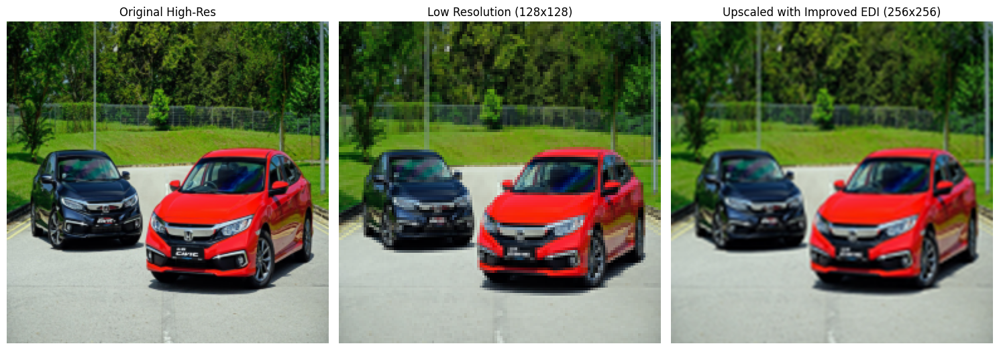

In [166]:
import numpy as np
from PIL import Image
from scipy.ndimage import convolve, gaussian_filter, zoom
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

def scharr_kernels():
    """Define Scharr kernels for edge detection."""
    scharr_x = np.array([[3, 0, -3], [10, 0, -10], [3, 0, -3]], dtype=np.float32)
    scharr_y = np.array([[3, 10, 3], [0, 0, 0], [-3, -10, -3]], dtype=np.float32)
    return scharr_x, scharr_y

def compute_gradients(image, sigma=1):
    """Compute edge gradients using combined Scharr kernels and Gaussian smoothing."""
    scharr_x, scharr_y = scharr_kernels()
    # Compute gradients for the entire image (all channels combined)
    gx = convolve(image, scharr_x[..., None])
    gy = convolve(image, scharr_y[..., None])
    magnitude = np.sqrt(gx*2 + gy*2)
    
    # Normalize gradients
    gx /= (magnitude + 1e-6)
    gy /= (magnitude + 1e-6)
    
    # Apply Gaussian smoothing
    gx = gaussian_filter(gx, sigma=sigma)
    gy = gaussian_filter(gy, sigma=sigma)
    return gx, gy, magnitude

def edge_aware_interpolation(low_res_image, scale):
    """Perform edge-aware interpolation."""
    h, w, c = low_res_image.shape
    upscaled_shape = (h * scale, w * scale, c)
    
    # Compute gradients
    grad_x, grad_y, magnitude = compute_gradients(low_res_image)
    
    # Perform bicubic interpolation for initialization
    bicubic_image = zoom(low_res_image, (scale, scale, 1), order=3)
    
    # Refine the upscaled image using edge-aware logic
    upscaled_image = bicubic_image.copy()
    for y in range(upscaled_shape[0]):
        for x in range(upscaled_shape[1]):
            low_x, low_y = x // scale, y // scale
            if magnitude[low_y, low_x].max() > 0.1:  # Edge threshold
                gx, gy = grad_x[low_y, low_x], grad_y[low_y, low_x]
                if np.abs(gx).sum() > np.abs(gy).sum():  # Edge direction
                    upscaled_image[y, x] = (bicubic_image[y, x] + low_res_image[low_y, low_x]) / 2
                else:
                    upscaled_image[y, x] = bicubic_image[y, x]
    
    return np.clip(upscaled_image, 0, 255).astype(np.uint8)

def calculate_psnr(original, reconstructed):
    """Calculate PSNR."""
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    return 20 * np.log10(max_pixel / np.sqrt(mse))

# Example usage
image = Image.open("dataset/train/high_res/0.png").convert("RGBA")  # Load RGBA image
low_res_image = image.resize((128, 128))  # Downscale for testing

low_res_array = np.array(low_res_image, dtype=np.float32)

# Perform Edge-Directed Interpolation
upscaled_image = edge_aware_interpolation(low_res_array, scale=2)

# Resize original image for evaluation
original_image = np.array(image, dtype=np.float32)
rescaled_original = zoom(original_image, (2, 2, 1), order=3)

image = np.array(image)
upscaled_image = np.array(upscaled_image)

# PSNR calculation
psnr = calculate_psnr(image, upscaled_image)
print(f"PSNR: {psnr:.2f} dB")

# SSIM calculation (for RGB channels only)
rescaled_original_rgb = image[:, :, :3]
upscaled_image_rgb = upscaled_image[:, :, :3]
ssim_value = ssim(
    rescaled_original_rgb, 
    upscaled_image_rgb, 
    win_size = 3,
    multichannel=True, 
    data_range=255
)
print(f"SSIM: {ssim_value:.4f}")

# Plot the results
fig, axes = plt.subplots(1, 3, figsize=(15, 10))
axes[0].imshow(np.array(image))
axes[0].set_title('Original High-Res')
axes[0].axis('off')

axes[1].imshow(low_res_image)
axes[1].set_title('Low Resolution (128x128)')
axes[1].axis('off')

axes[2].imshow(upscaled_image)
axes[2].set_title('Upscaled with Improved EDI (256x256)')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Lanczos Interpolation

PSNR: 32.51 dB
SSIM: 0.9168
tensor([[[[0.2416]]]], grad_fn=<AddBackward0>)


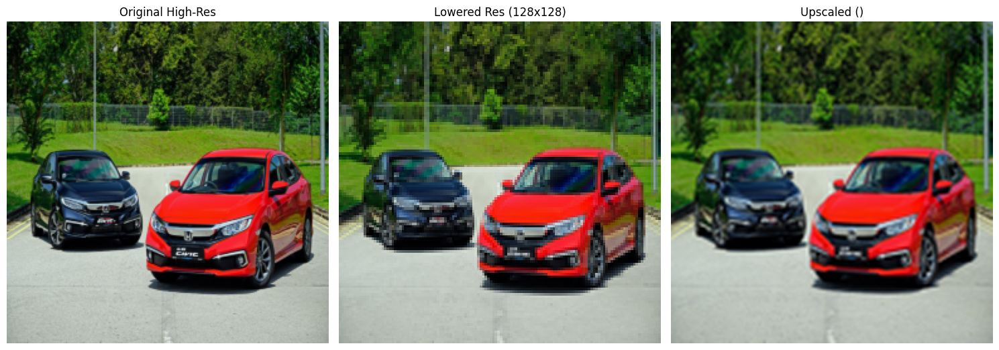

In [150]:
import numpy as np
from PIL import Image

def lanczos_kernel(x, a=3):
    if x == 0:
        return 1
    elif -a < x < a:
        return np.sinc(x) * np.sinc(x / a)
    else:
        return 0

def apply_lanczos(source, x, y, a=3, epsilon=1e-7):
    height, width, channels = source.shape
    x_int = int(x)
    y_int = int(y)
    
    # Weighted sum over the kernel window
    result = np.zeros((channels,), dtype=np.float64)
    weight_sum = 0.0

    for i in range(-a + 1, a):  # Lanczos kernel
        for j in range(-a + 1, a):
            xi = x_int + i
            yj = y_int + j

            # Check bounds
            if 0 <= xi < width and 0 <= yj < height:
                weight = lanczos_kernel(x - xi, a) * lanczos_kernel(y - yj, a)
                result += weight * source[yj, xi]
                weight_sum += weight

# (add epsilon for numerical stability)
    if weight_sum > epsilon:
        result /= weight_sum
    else:
        result.fill(0)  # Default case

    result = np.clip(result, 0, 255) #CLipping
    return result

def lanczos_interpolation(image, new_width, new_height, a=3):
    source = np.array(image, dtype=np.float64)
    old_height, old_width, channels = source.shape

    output = np.zeros((new_height, new_width, channels), dtype=np.uint8)

    scale_x = old_width / new_width
    scale_y = old_height / new_height

    for y in range(new_height):
        for x in range(new_width):
            source_x = x * scale_x
            source_y = y * scale_y

            output[y, x] = apply_lanczos(source, source_x, source_y, a)

    return Image.fromarray(output.astype(np.uint8))

# Load an RGBA image
input_image = Image.open("dataset/train/high_res/0.png").convert("RGBA")
low_res_image = input_image.resize((128,128))

new_width, new_height = 256, 256  # Example

output_image = lanczos_interpolation(low_res_image, new_width, new_height)

input_image = np.array(input_image)
output_image = np.array(output_image)

psnr = calculate_psnr(input_image, output_image)
print(f"PSNR: {psnr:.2f} dB")

ssim_value, _ = ssim(input_image, output_image, win_size=3, multichannel=True, full=True)
print(f"SSIM: {ssim_value:.4f}")

lpips_score = get_lpips_score(input_image[:, :, :3],output_image[:, :, :3])
print(lpips_score)


fig, axes = plt.subplots(1, 3, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

axes[ 1].imshow(low_res_image)
axes[ 1].set_title('Lowered Res (128x128)')
axes[ 1].axis('off')

axes[ 2].imshow(output_image)
axes[ 2].set_title('Upscaled ()')
axes[ 2].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

# KNN

In [278]:
import os
from PIL import Image

# Function to check if a file is an image based on its extension
def is_image(file_name):
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')
    return file_name.lower().endswith(valid_extensions)

# Function to resize images
def resize_image(image, target_size):
    return image.resize(target_size, Image.Resampling.LANCZOS)

# Resize images in the train and val folders
def resize_and_save_images():
    train_hr_folder = "data/train"
    train_lr_folder = "data/train/low_res"
    val_folder = "data/val"
    
    # Ensure the low-res folder exists
    if not os.path.exists(train_lr_folder):
        os.makedirs(train_lr_folder)

    # Resize and save HR images to 128x128
    train_target_images = os.listdir(train_hr_folder)
    for file in train_target_images:
        if not is_image(file):  # Skip non-image files
            continue
        img = Image.open(os.path.join(train_hr_folder, file))
        img = img.convert("L")  # Ensure it's grayscale
        resized_img = resize_image(img, (128, 128))
        resized_img.save(os.path.join(train_hr_folder, file))

    # Resize and save LR images to 64x64
    train_input_images = os.listdir(train_lr_folder)
    for file in train_input_images:
        if not is_image(file):  # Skip non-image files
            continue
        img = Image.open(os.path.join(train_lr_folder, file))
        img = img.convert("L")  # Ensure it's grayscale
        resized_img = resize_image(img, (64, 64))
        resized_img.save(os.path.join(train_lr_folder, file))
    
    # Resize and save HR images in val folder to 64x64
    val_images = os.listdir(val_folder)
    for file in val_images:
        if not is_image(file):  # Skip non-image files
            continue
        img = Image.open(os.path.join(val_folder, file))
        img = img.convert("L")  # Ensure it's grayscale
        resized_img = resize_image(img, (64, 64))
        resized_img.save(os.path.join(val_folder, file))

# Call the resize function before running the training code
resize_and_save_images()


In [303]:
import numpy as np
from PIL import Image
import os
import pickle
from skimage.util import view_as_blocks
from sklearn.neighbors import KDTree
from PIL import UnidentifiedImageError

train_features_dir = "data/train/low_res"
train_target_dir = "data/train"
test_features_dir = "data/val"
patch_size = 4
nn = 1

# Function to filter out non-image files
def is_image_file(filename):
    image_extensions = {'.jpg', '.jpeg', '.png', '.tif', '.tiff', '.bmp'}
    return os.path.splitext(filename)[1].lower() in image_extensions

# Identify actual image files
train_target_images = [file for file in os.listdir(train_target_dir) if is_image_file(file)]
train_input_images = [file for file in os.listdir(train_features_dir) if is_image_file(file)]
test_input_images = [file for file in os.listdir(test_features_dir) if is_image_file(file)]

# Correct array sizes based on actual image count
train_features = np.zeros((len(train_input_images), 64, 64))
train_targets = np.zeros((len(train_target_images), 128, 128))
test_features = np.zeros((len(test_input_images), 64, 64))

# Load train target images
for i, file in enumerate(train_target_images):
    img = Image.open(os.path.join(train_target_dir, file))
    img = img.convert("L")
    train_targets[i] = np.asarray(img)

# Load train input images
for i, file in enumerate(train_input_images):
    img = Image.open(os.path.join(train_features_dir, file))
    img = img.convert("L")
    train_features[i] = np.asarray(img)

# Load test input images
for i, file in enumerate(test_input_images):
    img = Image.open(os.path.join(test_features_dir, file))
    img = img.convert("L")
    test_features[i] = np.asarray(img)

# Block-wise operations
number_of_blocks = int((64 * 64) / (patch_size * patch_size))
train_blocks = np.zeros((number_of_blocks, len(train_input_images), patch_size * patch_size))
train_target_blocks = np.zeros((number_of_blocks, len(train_target_images), 4 * patch_size * patch_size))
test_blocks = np.zeros((number_of_blocks, len(test_input_images), patch_size * patch_size))

# Create blocks for training
feature_blocks = view_as_blocks(train_features, block_shape=(1, patch_size, patch_size)).squeeze()
target_blocks = view_as_blocks(train_targets, block_shape=(1, patch_size * 2, patch_size * 2)).squeeze()

for i in range(feature_blocks.shape[0]):
    for j in range(feature_blocks.shape[1]):
        for k in range(feature_blocks.shape[2]):
            n = feature_blocks.shape[1] * j + k
            train_blocks[n][i] = feature_blocks[i][j][k].reshape(patch_size * patch_size)
            train_target_blocks[n][i] = target_blocks[i][j][k].reshape(4 * patch_size * patch_size)

# Create blocks for testing
test_feature_blocks = view_as_blocks(test_features, block_shape=(1, patch_size, patch_size)).squeeze()

for i in range(test_feature_blocks.shape[0]):
    for j in range(test_feature_blocks.shape[1]):
        for k in range(test_feature_blocks.shape[2]):
            n = test_feature_blocks.shape[1] * j + k
            test_blocks[n][i] = test_feature_blocks[i][j][k].reshape(patch_size * patch_size)

# KDTree for nearest neighbor search
np.random.seed(1125)
kdtrees = {i: KDTree(train_blocks[i]) for i in range(number_of_blocks)}

# Perform nearest neighbor search
nearest = {}
for i in range(number_of_blocks):
    dist, ind = kdtrees[i].query(test_blocks[i], k=nn)
    nearest[i] = ind.flatten()

# Reconstruct images
output_dir = f"Outs"
os.makedirs(output_dir, exist_ok=True)

for i, file in enumerate(test_input_images):
    temp1 = []
    temp2 = []
    for j in range(number_of_blocks):
        if j % (number_of_blocks**0.5) == 0 and j != 0:
            temp1.append(temp2)
            temp2 = []
        
        # Use the correct indexing
        nearest_index = nearest[j][i]
        b = train_target_blocks[j][nearest_index].reshape(2 * patch_size, 2 * patch_size)
        temp2.append(b)
    
    temp1.append(temp2)
    img = np.array(temp1)
    img = img.transpose(0, 2, 1, 3).reshape(-1, img.shape[1] * img.shape[3])
    image = Image.fromarray(img).convert("L")
    image.save(os.path.join(output_dir, file), "PNG")

print("Image reconstruction completed.")
print(f"Processed {len(test_input_images)} test images")

Image reconstruction completed.
Processed 5 test images


In [308]:
example = [os.listdir("data/train/low_res")[0] if is_image_file(os.listdir("data/train/low_res")[0]) else None]
# example is a 1 element list

# SSIM and PSNR value
for i, file in enumerate(example):
    temp1 = []
    temp2 = []
    for j in range(number_of_blocks):
        if j % (number_of_blocks**0.5) == 0 and j != 0:
            temp1.append(temp2)
            temp2 = []
        
        # Use the correct indexing
        nearest_index = nearest[j][i]
        b = train_target_blocks[j][nearest_index].reshape(2 * patch_size, 2 * patch_size)
        temp2.append(b)
    
    temp1.append(temp2)
    img = np.array(temp1)
    img = img.transpose(0, 2, 1, 3).reshape(-1, img.shape[1] * img.shape[3])
    image = Image.fromarray(img).convert("L")
    image.save(os.path.join("", file), "PNG")



PSNR: 28.57 dB
SSIM: 0.4260
tensor([[[[0.2029]]]], grad_fn=<AddBackward0>)


(-0.5, 127.5, 127.5, -0.5)

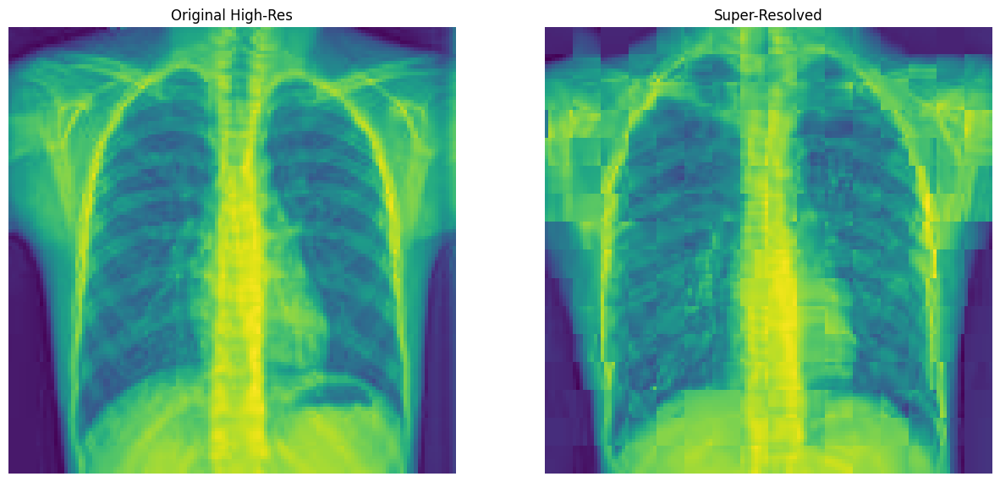

In [313]:
file = "IM-0031-0001.jpeg"
image_out = Image.open(file).convert("L")
image_high_res = Image.open("data/train/"+file).convert("L")

image_out = np.array(image_out)
image_high_res = np.array(image_high_res)

psnr = calculate_psnr(image_high_res, image_out)
print(f"PSNR: {psnr:.2f} dB")

# SSIM expects grayscale or RGB images in range [0, 255]
ssim_value, _ = ssim(image_high_res, image_out, win_size=3, multichannel=True, full=True)
print(f"SSIM: {ssim_value:.4f}")

lpips_score = get_lpips_score(image_high_res,image_out)
print(lpips_score)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
axes[ 0].imshow(image_high_res)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Lowered resolution image
axes[ 1].imshow(image_out)
axes[ 1].set_title('Super-Resolved')
axes[ 1].axis('off')

# Wavelet Transform based Methods

In [314]:
import numpy as np
import pywt
from PIL import Image
import matplotlib.pyplot as plt

def wavelet_super_resolution(image, scale=2, wavelet='haar'): # 'haar', 'db1', 'sym2'
    image = image.astype(np.float64)

    channels = [image[:, :, i] for i in range(image.shape[2])]

    # Process each channel
    upscaled_channels = []
    for channel in channels:
        # Step 1: Decompose into wavelet subbands
        coeffs2 = pywt.dwt2(channel, wavelet)
        LL, (LH, HL, HH) = coeffs2

        LH_up = np.kron(LH, np.ones((scale, scale)))  # Simple upsampling
        HL_up = np.kron(HL, np.ones((scale, scale)))
        HH_up = np.kron(HH, np.ones((scale, scale)))

        # Optional: Enhance high-frequency components (sharpening)
        LH_up *= 2.5
        HL_up *= 2.5
        HH_up *= 2

        LL_up = np.kron(LL, np.ones((scale, scale)))

        coeffs2_up = (LL_up, (LH_up, HL_up, HH_up))
        channel_hr = pywt.idwt2(coeffs2_up, wavelet)
        upscaled_channels.append(channel_hr)

    high_res_image = np.stack(upscaled_channels, axis=-1)

    # Clip to valid range and convert to uint8
    return np.clip(high_res_image, 0, 255).astype(np.uint8)

PSNR: 31.34 dB
SSIM: 0.8104
tensor([[[[0.4886]]]], grad_fn=<AddBackward0>)


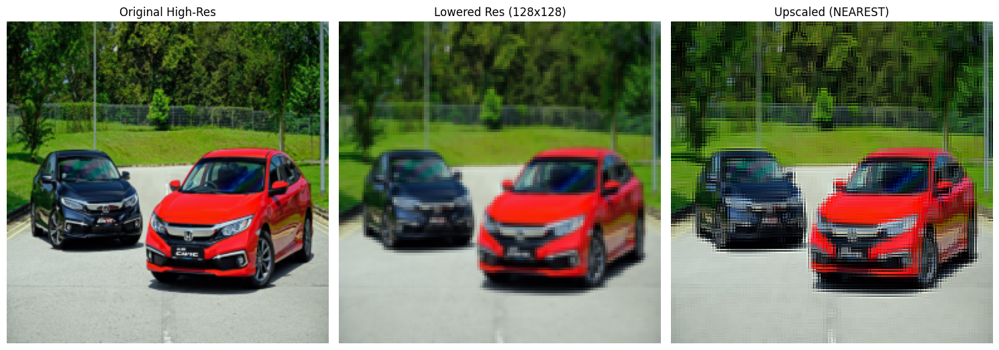

In [315]:
image = Image.open("dataset/train/high_res/0.png") # png image
low_res_image=Image.open("dataset/train/low_res/0.png")
low_res_image = low_res_image.resize((128,128))

image=np.array(image)
low_res_image=np.array(low_res_image)

upscaled_image = wavelet_super_resolution(low_res_image)

psnr = calculate_psnr(image, upscaled_image)
print(f"PSNR: {psnr:.2f} dB")

# SSIM expects grayscale or RGB images in range [0, 255]
ssim_value, _ = ssim(image, upscaled_image, win_size=3, multichannel=True, full=True)
print(f"SSIM: {ssim_value:.4f}")


lpips_score = get_lpips_score(image[:, :, :3],upscaled_image[:, :, :3])
print(lpips_score)

fig, axes = plt.subplots(1, 3, figsize=(15, 10))
axes[ 0].imshow(image)
axes[ 0].set_title('Original High-Res')
axes[ 0].axis('off')

# Lowered resolution image
axes[ 1].imshow(low_res_image)
axes[ 1].set_title('Lowered Res (128x128)')
axes[ 1].axis('off')

# Nearest Neighbor interpolation
axes[ 2].imshow(upscaled_image)
axes[ 2].set_title('Upscaled (NEAREST)')
axes[ 2].axis('off')

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.92)  # Adjust top to fit the title
plt.show()

# Extra Experiments - DL

In [128]:
import os
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, UpSampling2D, Add, Input, concatenate, Activation, Conv2DTranspose, MaxPool2D
from tensorflow.keras.models import Model
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras import backend as K
from tensorflow.keras import layers

def load_data(hr_dir, lr_dir, img_size):
    hr_images, lr_images = [], []

    hr_filenames = sorted(os.listdir(hr_dir))
    lr_filenames = sorted(os.listdir(lr_dir))

    for hr_file, lr_file in zip(hr_filenames, lr_filenames):
        if hr_file.endswith('.png') and lr_file.endswith('.png'):
            hr_path = os.path.join(hr_dir, hr_file)
            lr_path = os.path.join(lr_dir, lr_file)
    
            # Open images using PIL
            hr_img = Image.open(hr_path).convert("RGBA")
            lr_img = Image.open(lr_path).convert("RGBA")
    
            # Resize images
            hr_img = hr_img.resize((img_size[1] * 2, img_size[0] * 2))  # High-res target size
            lr_img = lr_img.resize(img_size)  # Low-res target size
    
            # Normalize to [0, 1]
            hr_images.append(np.array(hr_img) / 255.0)
            lr_images.append(np.array(lr_img) / 255.0)

    return np.array(hr_images), np.array(lr_images)

def combined_loss(y_true, y_pred, alpha=0):
    mse_loss = tf.reduce_mean(tf.square(y_true - y_pred))
    ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
    return alpha * mse_loss + (1 - alpha) * ssim_loss
    
SIZE = 128  # Input size for your case

def down(filters, kernel_size, apply_batch_normalization=True):
    """Downsampling block."""
    downsample = tf.keras.Sequential()
    downsample.add(layers.Conv2D(filters, kernel_size, padding='same', strides=2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(layers.LeakyReLU())
    return downsample

def up(filters, kernel_size, dropout=False):
    """Upsampling block."""
    upsample = tf.keras.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size, padding='same', strides=2))
    if dropout:
        upsample.add(layers.Dropout(0.2))
    upsample.add(layers.LeakyReLU())
    return upsample

def build_model(input_shape=(128, 128, 4)):
    """Super-resolution model ensuring correct output dimensions (256x256x4)."""
    inputs = layers.Input(shape=input_shape)

    # Downsampling blocks
    d1 = down(64, (3, 3), False)(inputs)  # 128x128 -> 64x64
    d2 = down(128, (3, 3), True)(d1)      # 64x64 -> 32x32
    d3 = down(256, (3, 3), True)(d2)      # 32x32 -> 16x16
    d4 = down(512, (3, 3), True)(d3)      # 16x16 -> 8x8

    # Bottleneck
    b = down(512, (3, 3), True)(d4)       # 8x8 -> 4x4

    # Upsampling blocks
    u1 = up(512, (3, 3), False)(b)        # 4x4 -> 8x8
    u1 = layers.concatenate([u1, d4])

    u2 = up(256, (3, 3), False)(u1)       # 8x8 -> 16x16
    u2 = layers.concatenate([u2, d3])

    u3 = up(128, (3, 3), False)(u2)       # 16x16 -> 32x32
    u3 = layers.concatenate([u3, d2])

    u4 = up(64, (3, 3), False)(u3)        # 32x32 -> 64x64
    u4 = layers.concatenate([u4, d1])

    # Final Upsampling to 256x256
    u5 = Conv2DTranspose(64, (3, 3), strides=2, padding='same', activation='relu')(u4)  # 64x64 -> 128x128
    u6 = Conv2DTranspose(64, (3, 3), strides=2, padding='same', activation='relu')(u5)  # 128x128 -> 256x256

    # Final output layer
    output = layers.Conv2D(4, (3, 3), strides=1, padding='same', activation='sigmoid')(u6)  # 256x256x4

    return tf.keras.Model(inputs=inputs, outputs=output)

def psnr_metric(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

def compile_model(model, learning_rate=0.01):
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss=combined_loss, metrics=['accuracy',psnr_metric])

def train_espcn(model, lr_images, hr_images, epochs=5, batch_size=16):

    model.fit(
        lr_images, hr_images,
        validation_split=0.1,
        epochs=epochs,
        batch_size=batch_size,
        verbose=1
    )

def evaluate_and_visualize(model, test_lr_dir, test_hr_dir,):
    hr_images,lr_images = load_data(test_hr_dir,test_lr_dir,(128,128))
    predictions = model.predict(lr_images)

    for i in range(3):
        plt.figure(figsize=(18, 6))

        plt.subplot(1, 3, 1)
        plt.title('Low Resolution')
        plt.imshow(lr_images[i])

        plt.subplot(1, 3, 2)
        plt.title('Super Resolution')
        plt.imshow(predictions[i])

        plt.subplot(1, 3, 3)
        plt.title('High Resolution (Ground Truth)')
        plt.imshow(hr_images[i])

        plt.show()

In [129]:
model = build_model(input_shape=(128, 128, 4))
model.summary()

compile_model(model)

Model: "functional_178"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_152     │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_104      │ (None, 64, 64,    │      2,368 │ input_layer_152[… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_105      │ (None, 32, 32,    │     74,368 │ sequential_104[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_106      │ (None, 16, 16,    │    296,192 │ sequential_105[0… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_107      │ (None, 8, 8, 512) │  1,182,208 │ sequential_106[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_108      │ (None, 4, 4, 512) │  2,361,856 │ sequential_107[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_109      │ (None, 8, 8, 512) │  2,359,808 │ sequential_108[0… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_52      │ (None, 8, 8,      │          0 │ sequential_109[0… │
│ (Concatenate)       │ 1024)             │            │ sequential_107[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_110      │ (None, 16, 16,    │  2,359,552 │ concatenate_52[0… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_53      │ (None, 16, 16,    │          0 │ sequential_110[0… │
│ (Concatenate)       │ 512)              │            │ sequential_106[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_111      │ (None, 32, 32,    │    589,952 │ concatenate_53[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_54      │ (None, 32, 32,    │          0 │ sequential_111[0… │
│ (Concatenate)       │ 256)              │            │ sequential_105[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_112      │ (None, 64, 64,    │    147,520 │ concatenate_54[0… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_55      │ (None, 64, 64,    │          0 │ sequential_112[0… │
│ (Concatenate)       │ 128)              │            │ sequential_104[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_77 │ (None, 128, 128,  │     73,792 │ concatenate_55[0… │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_78 │ (None, 256, 256,  │     36,928 │ conv2d_transpose… │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_251 (Conv2D) │ (None, 256, 256,  │      2,308 │ conv2d_transpose

 Total params: 9,486,852 (36.19 MB)

 Trainable params: 9,484,036 (36.18 MB)

 Non-trainable params: 2,816 (11.00 KB)

In [130]:
test_input = tf.random.normal([1, 128, 128, 4])
test_output = model(test_input)
print("Output shape:", test_output.shape)

Output shape: (1, 256, 256, 4)


In [131]:
# Main script
train_hr_dir = "dataset/train/high_res"
train_lr_dir = "dataset/train/low_res"
test_hr_dir = "dataset/val/high_res"
test_lr_dir = "dataset/val/low_res"

train_espcn(model, train_lr, train_hr, epochs=1, batch_size=8)

77/77 ━━━━━━━━━━━━━━━━━━━━ 59s 735ms/step - accuracy: 0.8223 - loss: 0.5851 - psnr_metric: 9.8026 - val_accuracy: 0.9672 - val_loss: 0.4791 - val_psnr_metric: 12.8210


6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 529ms/step


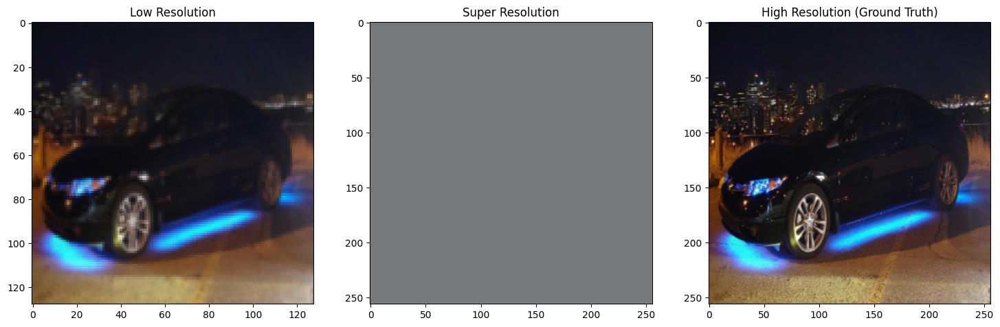

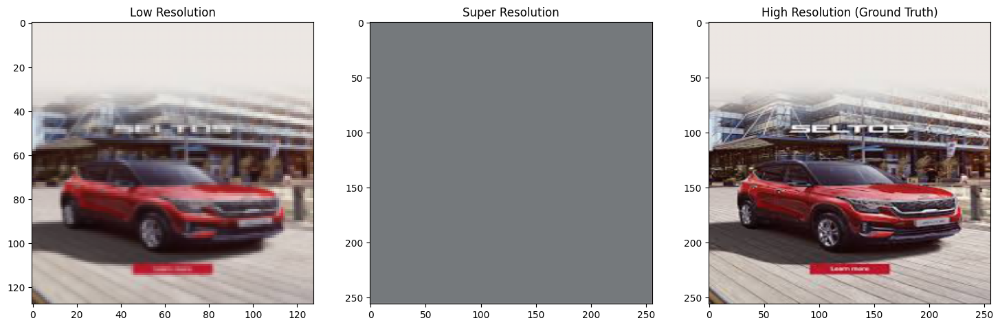

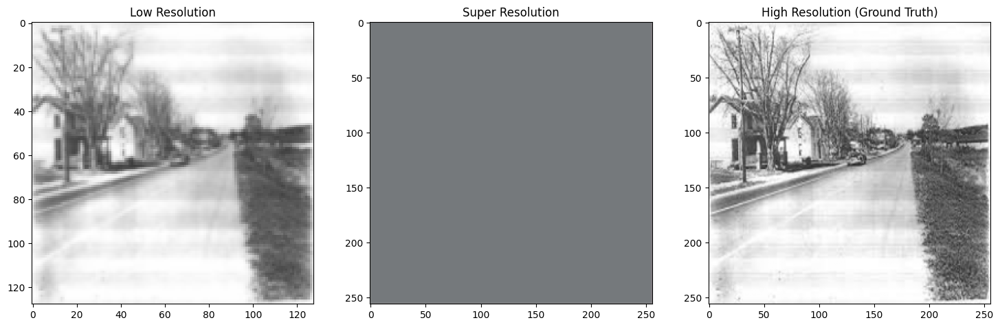

In [132]:
evaluate_and_visualize(model,test_lr_dir, test_hr_dir)

In [77]:
import torch
from lpips import LPIPS

# Initialize LPIPS metric
lpips_metric = LPIPS(net='alex')  # Use AlexNet backbone

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/opt/homebrew/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/homebrew/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /opt/homebrew/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


In [78]:
from skimage.metrics import structural_similarity as ssim

def compute_metrics(model, test_lr, test_hr):
    ssim_scores, psnr_scores, lpips_scores = [], [], []

    # Predict high-resolution images
    predictions = model.predict(test_lr)

    for i in range(len(test_lr)):
        # Convert to range [0, 255] for SSIM and PSNR computation
        pred = (predictions[i] * 255.0).astype(np.uint8)
        hr = (test_hr[i] * 255.0).astype(np.uint8)

        # Discard alpha channel for LPIPS (keep only RGB channels)
        pred_rgb = pred[:, :, :3]
        hr_rgb = hr[:, :, :3]

        # SSIM
        ssim_score = ssim(hr, pred, multichannel=True, data_range=255, win_size=3)
        ssim_scores.append(ssim_score)

        # PSNR
        psnr_score = tf.image.psnr(hr, pred, max_val=255)
        psnr_scores.append(psnr_score)

        # LPIPS
        # Convert to PyTorch tensors, transpose to [C, H, W], normalize to [-1, 1], and cast to float32
        pred_lpips = torch.tensor(pred_rgb / 255.0, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0) * 2 - 1
        hr_lpips = torch.tensor(hr_rgb / 255.0, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0) * 2 - 1
        
        # Compute LPIPS score
        lpips_score = lpips_metric(pred_lpips, hr_lpips).item()
        lpips_scores.append(lpips_score)

        # Compute LPIPS score
        lpips_score = lpips_metric(pred_lpips, hr_lpips).item()
        lpips_scores.append(lpips_score)

    # Average metrics over the dataset
    avg_ssim = np.mean(ssim_scores)
    avg_psnr = np.mean(psnr_scores)
    avg_lpips = np.mean(lpips_scores)

    print(f"Average SSIM: {avg_ssim:.4f}")
    print(f"Average PSNR: {avg_psnr:.4f} dB")
    print(f"Average LPIPS: {avg_lpips:.4f}")

    return avg_ssim, avg_psnr, avg_lpips

In [79]:
avg_ssim,avg_psnr,avg_lpips = compute_metrics(model,test_lr,test_hr)

6/6 ━━━━━━━━━━━━━━━━━━━━ 24s 4s/step
Average SSIM: 0.5110
Average PSNR: 12.7690 dB
Average LPIPS: 0.9717
